In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
# Disable warnings 
import plotly.express as px
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot
import cufflinks
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')

import seaborn as sns
sns.set(style="whitegrid")


#pydicom
#import pydicom

# Suppress warnings 
import warnings
warnings.filterwarnings('ignore')


# Settings for pretty nice plots
plt.style.use('fivethirtyeight')
plt.show()
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv("train-2.csv")

In [3]:
df.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,no
1,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,no
2,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no
3,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,no
4,MA,121,area_code_510,no,yes,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,no


In [4]:
# Total_Calls/day Colum
df['Total_Calls'] = df['total_day_calls']+ df['total_eve_calls'] + df['total_night_calls']
# Creating Total Mins/day Column
df['Total Mins'] = df['total_day_minutes']+df['total_eve_minutes']+df['total_night_minutes']
# Creating Total_Charge/day Column
df['Total_Charge'] = df['total_day_charge']+df['total_eve_charge']+df['total_night_charge']

In [5]:
df.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,...,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn,Total_Calls,Total Mins,Total_Charge
0,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,...,103,11.45,13.7,3,3.70,1,no,329,611.5,55.54
1,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,...,104,7.32,12.2,5,3.29,0,no,328,527.2,59.00
2,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,...,89,8.86,6.6,7,1.78,2,no,248,558.2,65.02
3,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,...,121,8.41,10.1,3,2.73,3,no,356,501.9,49.36
4,MA,121,area_code_510,no,yes,24,218.2,88,37.09,348.5,...,118,9.57,7.5,7,2.03,3,no,314,779.3,76.28


In [6]:
df.groupby(["state", "area_code"])["international_plan"].count()

state  area_code    
AK     area_code_408    12
       area_code_415    31
       area_code_510    18
AL     area_code_408    30
       area_code_415    54
                        ..
WV     area_code_415    62
       area_code_510    43
WY     area_code_408    24
       area_code_415    52
       area_code_510    19
Name: international_plan, Length: 153, dtype: int64

In [7]:
df['churn'].value_counts(normalize=True).iplot(kind='bar',
                                                      yTitle='Percentage', 
                                                      linecolor='black', 
                                                      opacity=0.7,
                                                      color='red',
                                                      theme='pearl',
                                                      bargap=0.8,
                                                      gridcolor='white',
                                                     
                                                      title='Distribution OF Taget Column - 85.9% Non-Churners & 14.1% Churners')

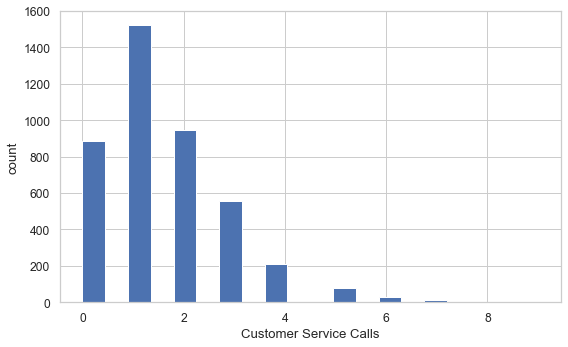

In [153]:
sns.set(style='whitegrid', palette="deep", font_scale=1.1, rc={"figure.figsize": [8, 5]})
sns.distplot(
    df['number_customer_service_calls'], norm_hist=False, kde=False, bins=20, hist_kws={"alpha": 1}
).set(xlabel='Customer Service Calls', ylabel='count');


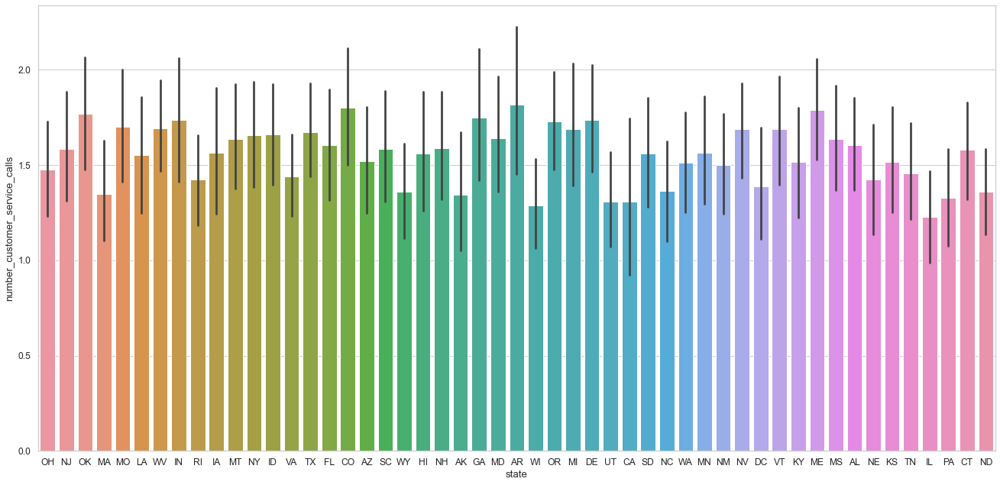

In [154]:
#s = df.sort(columns=["number_customer_service_calls"], axis=0, ascending=True)
plt.figure(figsize=(20,10))
sns.barplot(x="state", y="number_customer_service_calls", data=df)

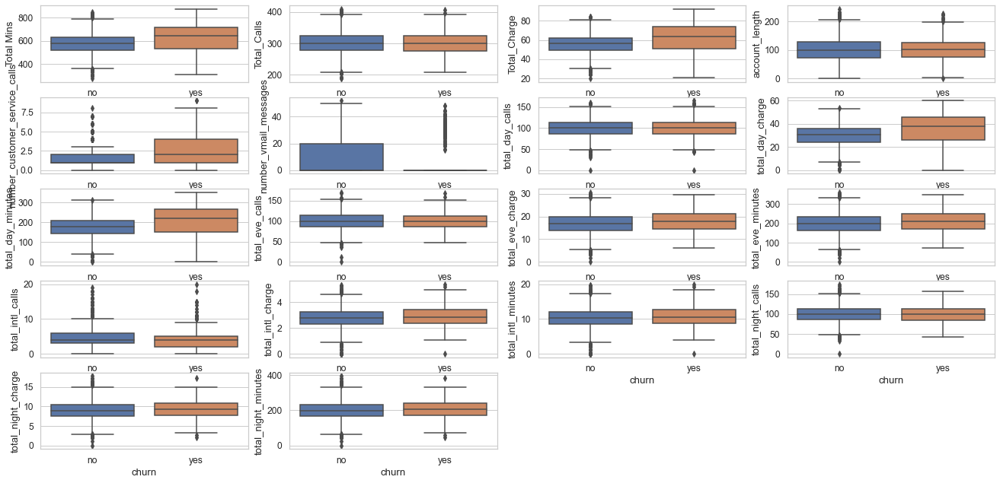

In [155]:
#numerical columns
num_var = df.columns.difference(['state','area_code','international_plan','voice_mail_plan', 'churn'])
num_var
# we can see the visibility of the outliers in each  variable.
plt.figure(figsize=(20,10))
for i, c in enumerate(num_var):
    plt.subplot(5,4, i+1)
    sns.boxplot(x='churn', y=c, data=df)
plt.show()

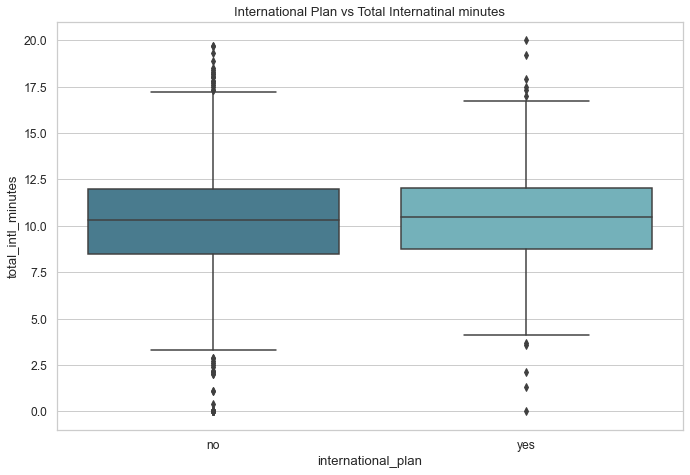

In [156]:
plt.figure(figsize = (10,7))
sns.boxplot(x = 'international_plan', y = 'total_intl_minutes', data = df, palette= 'GnBu_d').set_title('International Plan vs Total Internatinal minutes')
plt.show()

Tne customers with international plan or not there is no much diffrences in making the amount of international minutes.
May be the customers dose not want to go on contract to pay heavy cancellation charges because of there short stay in that particular region.
Recomdation:For  retaining the customers the business should go for short term contract with lesser cancellation fees may gives customers atleast stay for a while and mean while remind them to renue the contract nearing to expiration with some loyalty benifts etc.

Text(0.5, 26.256000000000014, 'No Churners vs Churners')

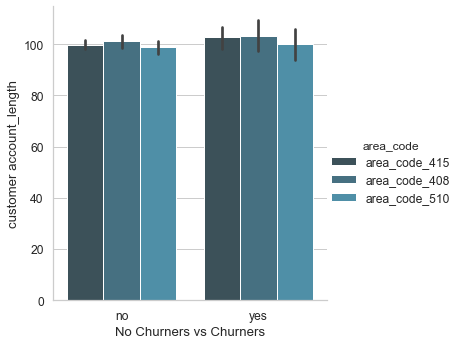

In [33]:
sns.catplot(x='churn',y='account_length', hue='area_code',data=df,kind='bar')
plt.ylabel('customer account_length')
plt.xlabel('No Churners vs Churners')

Text(0.5, 26.256000000000014, 'No Churners vs Churners')

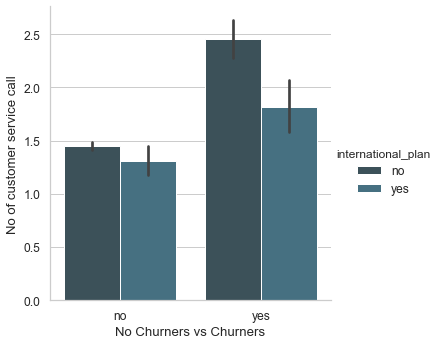

In [34]:
sns.catplot(x='churn',y='number_customer_service_calls', hue='international_plan',data=df,kind='bar')
plt.ylabel('No of customer service call')
plt.xlabel('No Churners vs Churners')

High churners are the people without international plan

In [8]:
import chart_studio.plotly as py
import plotly.graph_objs as go 
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True) 
data = dict(type = 'choropleth',
            locations = ['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA', 'HI',
       'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA', 'MD', 'ME', 'MI', 'MN',
       'MO', 'MS', 'MT', 'NC', 'ND', 'NE', 'NH', 'NJ', 'NM', 'NV', 'NY', 'OH',
       'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VA', 'VT', 'WA',
       'WI', 'WV', 'WY'],
            locationmode = 'USA-states',
            colorscale= 'Portland',
            text= ['text1','text2','text3','text4'],
            z=df['number_customer_service_calls'],
            colorbar = {'title':'Customer Service Calls'})
layout = dict(title = 'Number of customer service calls made',geo = {'scope':'usa'})
choromap = go.Figure(data = [data],layout = layout)
iplot(choromap)

State IA and KY are the highest customer service calls made then 2nd highest states are AZ,CA,WY and OR

Text(0.5, 30.119999999999976, 'No Churners vs Churners')

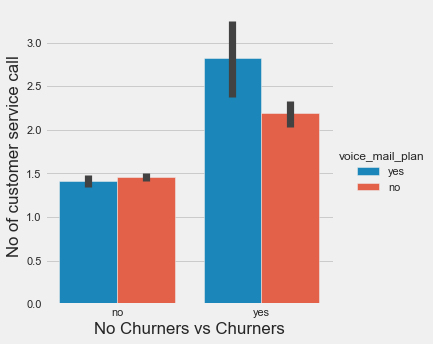

In [9]:
sns.catplot(x='churn',y='number_customer_service_calls', hue='voice_mail_plan',data=df,kind='bar')
plt.ylabel('No of customer service call')
plt.xlabel('No Churners vs Churners')

Voice mail plan customers are the more churners which is clearly visible over here.

Text(0.5, 30.119999999999976, 'No Churners vs Churners')

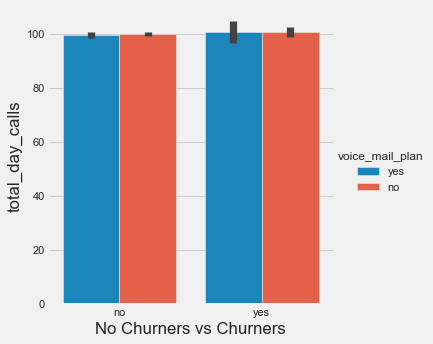

In [10]:
sns.catplot(x='churn',y='total_day_calls', hue='voice_mail_plan',data=df,kind='bar')
plt.ylabel('total_day_calls')
plt.xlabel('No Churners vs Churners')

The customers do prefer to attened there day calls .It seems to be the churners are not so satisfied with the voice mail plan

Text(0.5, 11.120000000000005, 'No Churners vs Churners')

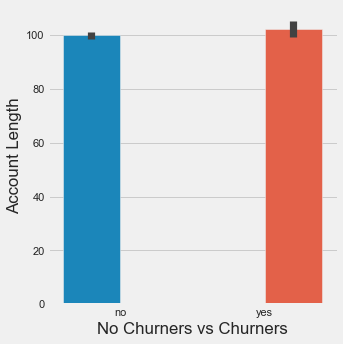

In [11]:
sns.catplot(x='churn',y='account_length', hue='churn',data=df,kind='bar')
plt.ylabel('Account Length')
plt.xlabel('No Churners vs Churners')

This graph shows that even the old customers may leave anytime.It show that they are moving to the better one.
Business have to identify the customer needs through micro segmenting which leads to better customer retention.


Text(0.5, 11.120000000000005, 'No Churners vs Churners')

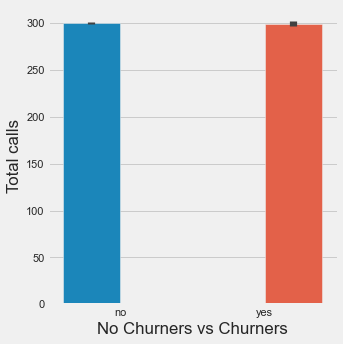

In [12]:
sns.catplot(x='churn',y='Total_Calls', hue='churn',data=df,kind='bar')
plt.ylabel('Total calls')
plt.xlabel('No Churners vs Churners')

There is no much differences in total calls made bye churn and non-churners.Both were equally utilizing the service

Text(0.5, 11.120000000000005, 'No Churners vs Churners')

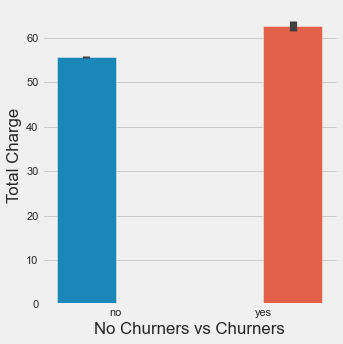

In [13]:
sns.catplot(x='churn',y='Total_Charge', hue='churn',data=df,kind='bar')
plt.ylabel('Total Charge')
plt.xlabel('No Churners vs Churners')

The churned customers where paying more than the non_churners

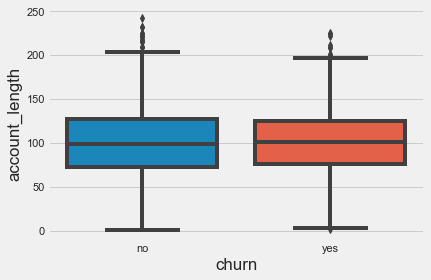

In [14]:
sns.boxplot(x = 'churn', y ='account_length',data = df)

The customers who stayed nearly 210 months are the old custmers than the customer less than 200 months.s there is no much diffrences makes churners due the lenght of stay or vise versa

In [15]:
from __future__ import division
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=False)
from bubbly.bubbly import bubbleplot


figure = bubbleplot(dataset=df, x_column='Total_Calls', y_column='Total_Charge', 
    bubble_column='state',size_column='number_customer_service_calls', color_column='state', 
    x_title="Total_Calls", y_title="Total_Charge", title = 'Total_Calls Vs Total_Charge',
    x_logscale=True, scale_bubble=4, height=650)

iplot(figure);



In [16]:
df.columns

Index(['state', 'account_length', 'area_code', 'international_plan',
       'voice_mail_plan', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'churn', 'Total_Calls', 'Total Mins',
       'Total_Charge'],
      dtype='object')

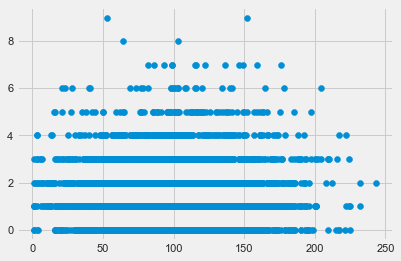

In [17]:
plt.scatter(x='account_length',y='number_customer_service_calls',data=df)

This plot shows old and new customers have attempted many no of customer service calls.

Text(46.22039097222222, 0.5, 'count of customers')

<Figure size 1440x1440 with 0 Axes>

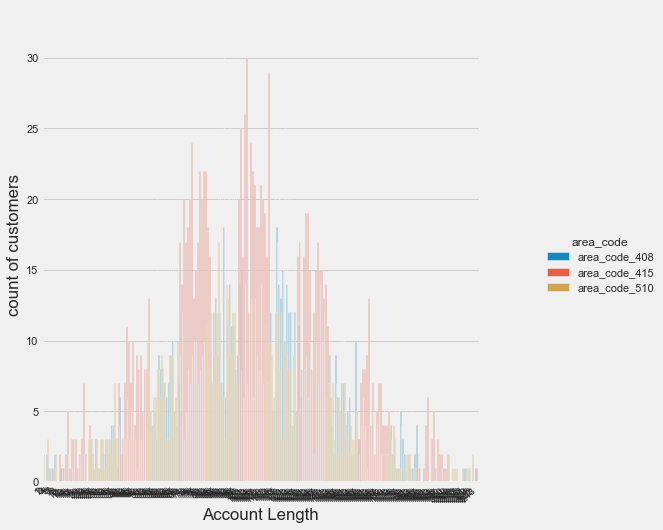

In [18]:
plt.figure(figsize=(20,20))
z1=df.groupby(['area_code','account_length'])['churn'].count().to_frame().reset_index()
z1.style.background_gradient(cmap='Reds')
sns.catplot(x='account_length',y='churn', hue='area_code',data=z1,kind='bar')
plt.gcf().set_size_inches(10,8)
plt.xlabel('Account Length')
plt.xticks(rotation=45,fontsize='10', horizontalalignment='right')
plt.ylabel('count of customers')

More number of customers belong to area_code_415

In [19]:
df.iplot(kind='box')

<Figure size 1440x1440 with 0 Axes>

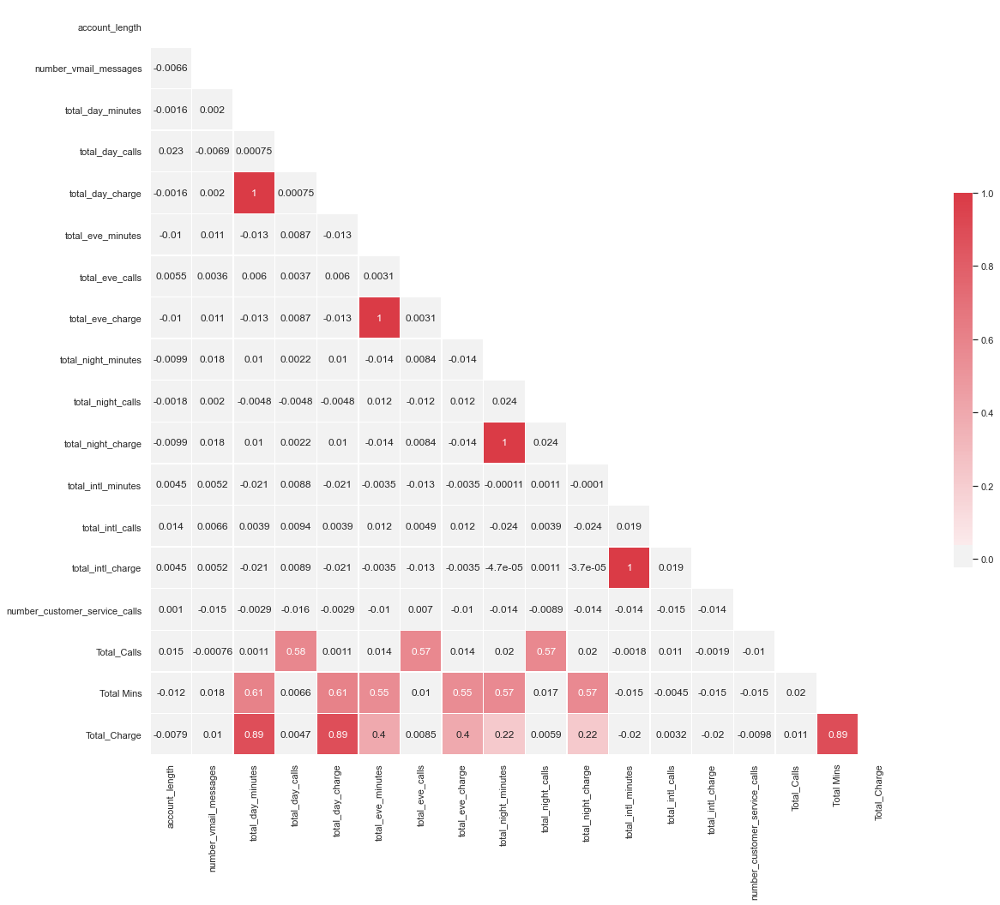

In [20]:
plt.figure(figsize=(20,20))

#Calculate the correlation of the above variables
# Copied code from seaborn examples
# https://seaborn.pydata.org/examples/many_pairwise_correlations.html
sns.set(style="white")

# Generate a mask for the upper triangle
mask = np.zeros_like(df.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 15))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(df.corr(), mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

plt.show();




Variables correlated (total_international minutes is highly correlated with total_int_charges, total_night_minutes with tatal_night_charge,total_eve_minutes withtotal evening charge,total_day_minutes with total_day_charge,total charge with total_dat_minutes,total_day_charge,total_eve_minutes,total_night_minutes,total night_charge).The light box are positively correlated variable with corresponding variables.

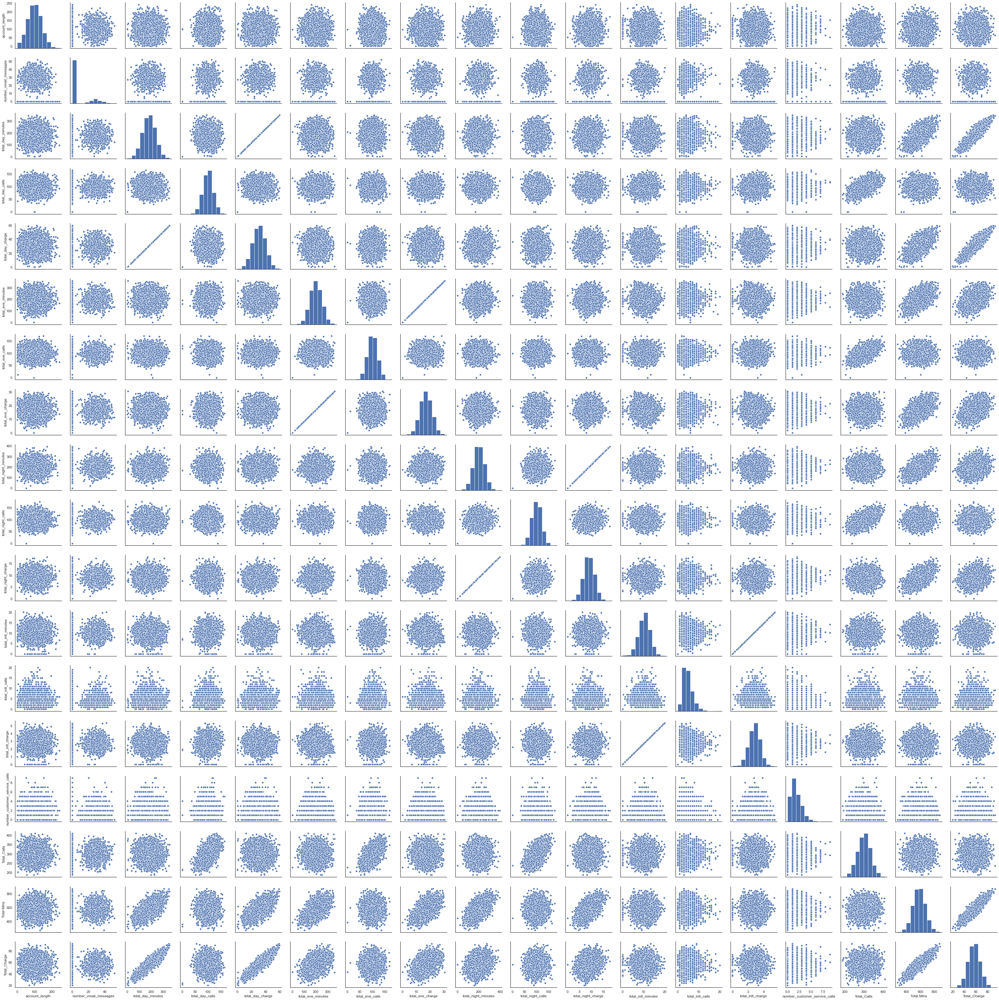

In [21]:
sns.pairplot(df)

In [22]:
df['churn'].value_counts()

no     3652
yes     598
Name: churn, dtype: int64

In [23]:
df.corr()

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,Total_Calls,Total Mins,Total_Charge
account_length,1.000000,-0.006626,-0.001612,0.023002,-0.001613,-0.010326,0.005535,-0.010322,-0.009916,-0.001846,-0.009942,0.004539,0.013690,0.004494,0.001002,0.015396,-0.012443,-0.007880
number_vmail_messages,-0.006626,1.000000,0.002000,-0.006920,0.001994,0.010725,0.003593,0.010736,0.018308,0.001977,0.018300,0.005220,0.006585,0.005249,-0.015303,-0.000759,0.017662,0.010222
total_day_minutes,-0.001612,0.002000,1.000000,0.000747,1.000000,-0.013248,0.005986,-0.013258,0.010049,-0.004812,0.010036,-0.021369,0.003859,-0.021291,-0.002925,0.001084,0.606288,0.885240
total_day_calls,0.023002,-0.006920,0.000747,1.000000,0.000751,0.008661,0.003739,0.008663,0.002206,-0.004815,0.002200,0.008834,0.009377,0.008909,-0.015845,0.576323,0.006605,0.004730
total_day_charge,-0.001613,0.001994,1.000000,0.000751,1.000000,-0.013247,0.005985,-0.013257,0.010053,-0.004816,0.010040,-0.021374,0.003853,-0.021296,-0.002932,0.001084,0.606290,0.885241
total_eve_minutes,-0.010326,0.010725,-0.013248,0.008661,-0.013247,1.000000,0.003101,1.000000,-0.014018,0.011973,-0.014031,-0.003509,0.012239,-0.003460,-0.010063,0.013784,0.549720,0.398463
total_eve_calls,0.005535,0.003593,0.005986,0.003739,0.005985,0.003101,1.000000,0.003120,0.008425,-0.011929,0.008441,-0.013096,0.004949,-0.013145,0.006956,0.573842,0.010170,0.008458
total_eve_charge,-0.010322,0.010736,-0.013258,0.008663,-0.013257,1.000000,0.003120,1.000000,-0.014022,0.011971,-0.014035,-0.003512,0.012239,-0.003463,-0.010071,0.013795,0.549711,0.398453
total_night_minutes,-0.009916,0.018308,0.010049,0.002206,0.010053,-0.014018,0.008425,-0.014022,1.000000,0.023815,0.999999,-0.000113,-0.024280,-0.000047,-0.013771,0.020056,0.565074,0.222402
total_night_calls,-0.001846,0.001977,-0.004812,-0.004815,-0.004816,0.011973,-0.011929,0.011971,0.023815,1.000000,0.023798,0.001093,0.003851,0.001054,-0.008893,0.574337,0.017348,0.005887


In [24]:
import chart_studio.plotly as py
import plotly.graph_objs as go 
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True) 
data = dict(type = 'choropleth',
            locations = ['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA', 'HI',
       'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA', 'MD', 'ME', 'MI', 'MN',
       'MO', 'MS', 'MT', 'NC', 'ND', 'NE', 'NH', 'NJ', 'NM', 'NV', 'NY', 'OH',
       'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VA', 'VT', 'WA',
       'WI', 'WV', 'WY'],
            locationmode = 'USA-states',
            colorscale= 'Portland',
            text= ['text1','text2','text3','text4'],
            z=df['total_day_minutes'],
            colorbar = {'title':'Day Minutes'})
layout = dict(title = 'Day Call Customers by State',geo = {'scope':'usa'})
choromap = go.Figure(data = [data],layout = layout)
iplot(choromap)

In [25]:
import chart_studio.plotly as py
import plotly.graph_objs as go 
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True) 
data = dict(type = 'choropleth',
            locations = ['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA', 'HI',
       'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA', 'MD', 'ME', 'MI', 'MN',
       'MO', 'MS', 'MT', 'NC', 'ND', 'NE', 'NH', 'NJ', 'NM', 'NV', 'NY', 'OH',
       'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VA', 'VT', 'WA',
       'WI', 'WV', 'WY'],
            locationmode = 'USA-states',
            colorscale= 'Portland',
            text= ['text1','text2','text3','text4'],
            z=df['Total_Charge'],
            colorbar = {'title':'Total charge'})
layout = dict(title = 'Revenues by State',geo = {'scope':'usa'})
choromap = go.Figure(data = [data],layout = layout)
iplot(choromap)


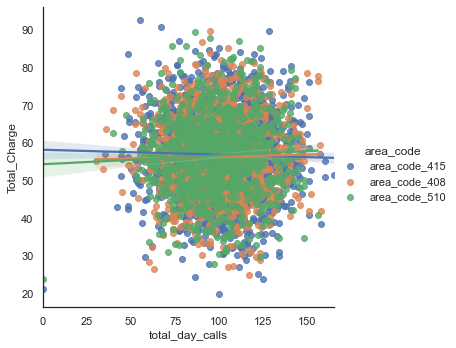

In [26]:
g = sns.lmplot(
    data=df,
    x="total_day_calls", y="Total_Charge", hue="area_code",
    height=5
)

# Use more informative axis labels than are provided by default
g.set_axis_labels("total_day_calls", "Total_Charge")

In [27]:
#area_code 415 and the churners and non churners
df['area_code'].value_counts()

area_code_415    2108
area_code_408    1086
area_code_510    1056
Name: area_code, dtype: int64

area_code_510 has a positive correlalation and also if the business prioritise this area first then secondly area_code_408 lastly area_code 415, evenue will be increased if the business prioritise the area_caode _510 customers.

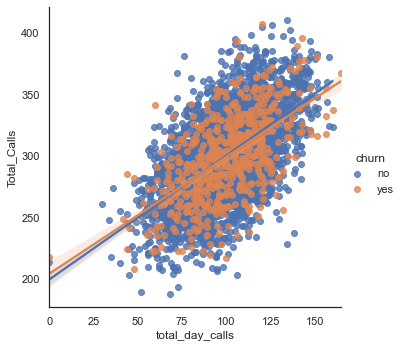

In [28]:

g = sns.lmplot(
    data=df,
    x="total_day_calls", y="Total_Calls", hue="churn",
    height=5
)

# Use more informative axis labels than are provided by default
g.set_axis_labels("total_day_calls", "Total_Calls")

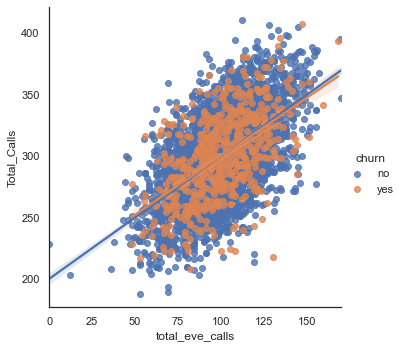

In [29]:
g = sns.lmplot(
    data=df,
    x="total_eve_calls", y="Total_Calls", hue="churn",
    height=5
)

# Use more informative axis labels than are provided by default
g.set_axis_labels("total_eve_calls", "Total_Calls")

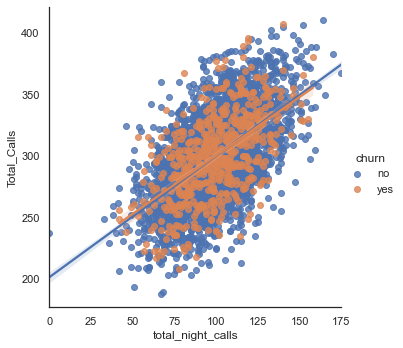

In [30]:
g = sns.lmplot(
    data=df,
    x="total_night_calls", y="Total_Calls", hue="churn",
    height=5
)

# Use more informative axis labels than are provided by default
g.set_axis_labels("total_night_calls", "Total_Calls")

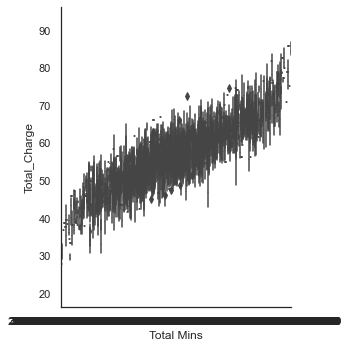

In [31]:
sns.catplot(x="Total Mins", y="Total_Charge", kind="box", data=df);
sns.set_palette("GnBu_d")
sns.set_style('whitegrid')

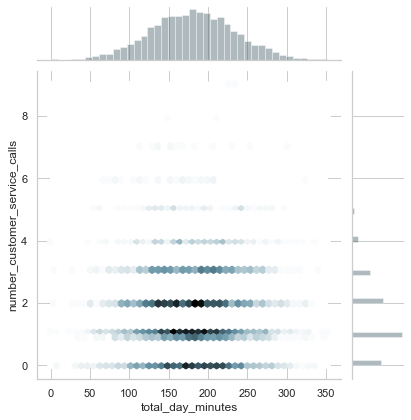

In [32]:
sns.jointplot(x='total_day_minutes',y='number_customer_service_calls',kind='hex',data=df)
sns.set_palette("GnBu_d")
sns.set_style('whitegrid')

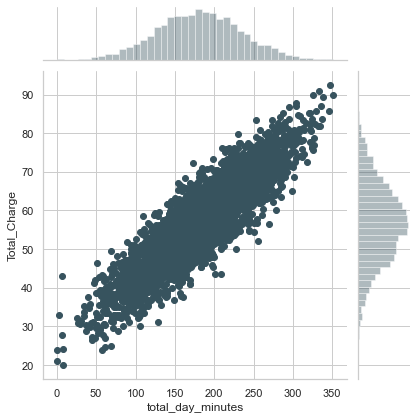

In [33]:
sns.jointplot(x='total_day_minutes',y='Total_Charge',data=df);

There is more correlation between the total day minutes and the total charge.
The business has to create a plan to attract the customeres who spend moreminutes during day time on calls to attract them and turn them to be a loyal customers.

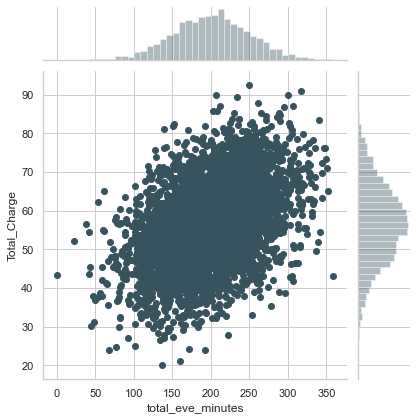

In [34]:
sns.jointplot(x='total_eve_minutes',y='Total_Charge',data=df);

The data point are scattered so almost every one call during evenining time they spend time on calls.There is a correlation of .40 between total evening minutes spent and the total charge.So business can attract these customers to provide a plan which increces the revenue and also retain the customers.

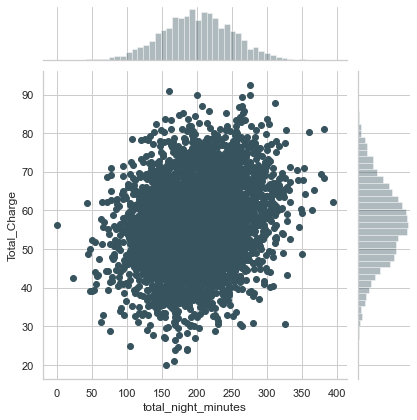

In [35]:
sns.jointplot(x='total_night_minutes',y='Total_Charge',data=df);

The datapoint are scatterd.There is slight correlation 0.22 between the total charge and the total night minutes 

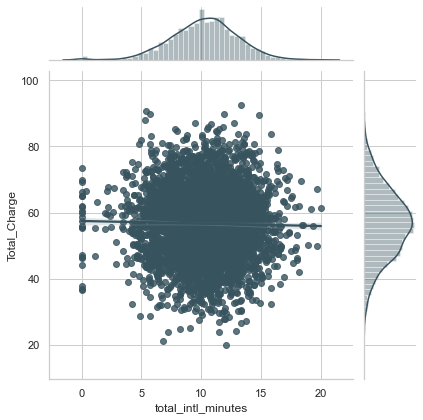

In [36]:
sns.jointplot(x='total_intl_minutes',y='Total_Charge',data=df,kind='reg');

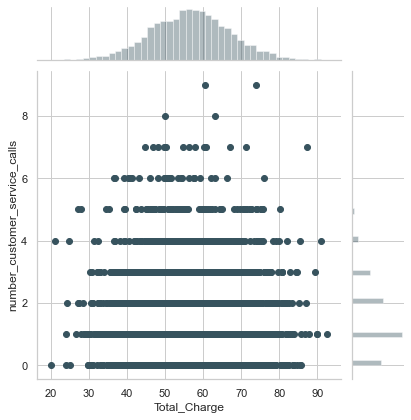

In [37]:
sns.jointplot(x='Total_Charge',y='number_customer_service_calls',data=df);